<a href="https://colab.research.google.com/github/gary109/Colab_Notebooks/blob/main/Fine_Tune_DetrForObjectDetection_on_STAS_dataset_with_hugVision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 確認 GPU 類型
---

In [ ]:
import torch
if not torch.cuda.is_available():
  raise Exception("GPU not availalbe. CPU training will be too slow.")
print("device name", torch.cuda.get_device_name(0))

device name Tesla T4


# 是否要掛載 Google Drive
---

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# FOR TPU needs
---

In [ ]:
%%capture
!pip uninstall -y torch
!pip install torch==1.8.2+cpu torchvision==0.9.2+cpu -f https://download.pytorch.org/whl/lts/1.8/torch_lts.html
!pip install cloud-tpu-client==0.10 https://storage.googleapis.com/tpu-pytorch/wheels/torch_xla-1.8-cp37-cp37m-linux_x86_64.whl

# 安裝 transformers,datastes,... 相依套件
---

In [ ]:
# %%capture
!pip install git+https://github.com/huggingface/datasets.git
!pip install git+https://github.com/huggingface/transformers.git
!pip install soundfile
!pip install jiwer
!git clone https://github.com/huggingface/transformers.git
!apt install git-lfs
!git config --global user.email "gary109@gmail.com"
!git config --global user.name "GARY"
!git config --global credential.helper store
!pip install wandb
!wandb login 2cf656515a3b158f4f603aeba63181236de2fc1b

# 登入 huggingface 
---

In [ ]:
! huggingface-cli login
# from huggingface_hub import notebook_login
# notebook_login()


        _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
        _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
        _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
        _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
        _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

        To login, `huggingface_hub` now requires a token generated from https://huggingface.co/settings/tokens.
        (Deprecated, will be removed in v0.3.0) To login with username and password instead, interrupt with Ctrl+C.
        
Token: 
Login successful
Your token has been saved to /root/.huggingface/token


# 產出 via_region_data.json 
肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽 I：運用物體偵測作法於找尋STAS

In [ ]:
!pip install beautifulsoup4 lxml

In [ ]:
%cd /content/drive/MyDrive/datasets/肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽 I：運用物體偵測作法於找尋STAS

/content/drive/MyDrive/datasets/肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽 I：運用物體偵測作法於找尋STAS


In [ ]:
from tqdm import tqdm
import json 
from pathlib import Path
from os.path import exists
import xml.etree.ElementTree as ET
import os

In [ ]:
jpg_path = '/content/drive/MyDrive/datasets/肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽 I：運用物體偵測作法於找尋STAS/OBJ_Train_Datasets/Train_Images'
ann_path = '/content/drive/MyDrive/datasets/肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽 I：運用物體偵測作法於找尋STAS/OBJ_Train_Datasets/Train_Annotations'
output_region_data = {}

In [ ]:
for path in tqdm(list(Path(jpg_path).rglob("*.jpg"))):
    basename = os.path.basename(path)
    file_size = os.stat(path).st_size
    base_id = f"{basename}{file_size}"
    filename = basename.split(".")[0]
    ann_file = os.path.join(ann_path,f"{filename}.xml")
    
    assert exists(ann_file), f"Not found {ann_file}"

    tree = ET.parse(ann_file)
    root = tree.getroot()
    x_lists = []
    y_lists = []
    
    for elem in root.iter(tag='bndbox'):     
        xmin = int(elem.find('xmin').text)
        xmax = int(elem.find('xmax').text)
        x_lists.append([xmin,xmax])


        ymin = int(elem.find('ymin').text)
        ymax = int(elem.find('ymax').text)
        y_lists.append([ymin,ymax])
    
    output_region_data[base_id] = {
        'fileref' : "",
        'size' : file_size,
        'filename':basename,
        'base64_img_data' : "",
        'file_attributes' : {},
        'regions' : {
            f'{i}':{
                "shape_attributes" : {
                    "name": "rect",
                    "all_points_x": x_list,
                    "all_points_y": y_list,
                },"region_attributes": {}

            }
            for i,(x_list,y_list) in enumerate(zip(x_lists,y_lists))

        }
    }

with open( os.path.join(jpg_path, 'via_region_data.json'), "w") as f:
    json.dump(output_region_data, f)
# json_object = json.dumps(output_region_data,indent = 4) 
# print(json_object)

100%|██████████| 1053/1053 [00:01<00:00, 573.65it/s]


# 產出 train/val ---> via_region_data.json

In [ ]:
with open(os.path.join(jpg_path, 'via_region_data.json')) as f:
    region_data = json.load(f)

In [ ]:
region_lists = []
for k,v in region_data.items():
    region_lists.append([k,v])
len(region_lists)

1053

In [ ]:
from sklearn.model_selection import train_test_split
train_size =0.9
X = region_lists
y = region_lists
X_train, X_valid, y_train, y_valid = train_test_split(X,y, train_size=train_size, random_state=109)
len(X_train),len(X_valid)

(947, 106)

##  產出 train_via_region_data.json ＆val_via_region_data.json

In [ ]:
train_region_data = {k:v for k,v in X_train}
val_region_data = {k:v for k,v in X_valid}

with open( os.path.join(jpg_path, f'train_via_region_data.json'), "w") as f:
    json.dump(train_region_data, f)

with open( os.path.join(jpg_path, f'val_via_region_data.json'), "w") as f:
    json.dump(val_region_data, f)

# 產出 train/val folder
肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽 I：運用物體偵測作法於找尋STAS

In [ ]:
%cd /content/drive/MyDrive/datasets/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS

In [ ]:
root = '/content/drive/MyDrive/datasets/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS'
original_train_root_path = os.path.join(root, 'OBJ_Train_Datasets','Train_Images')
train_region_data_path = os.path.join(root, 'OBJ_Train_Datasets','Train_Images', 'train_via_region_data.json')
val_region_data_path = os.path.join(root, 'OBJ_Train_Datasets','Train_Images', 'val_via_region_data.json')
test_region_data_path = os.path.join(root, 'OBJ_Train_Datasets','Train_Images', 'test_via_region_data.json')


with open(train_region_data_path) as f:
    train_region_data = json.load(f)

with open(val_region_data_path) as f:
    val_region_data = json.load(f)

with open(val_region_data_path) as f:
    test_region_data = json.load(f)

## 建立 Train / Val / Test Folder

## Copy Train Datasets to new Train folder

In [ ]:
from tqdm import tqdm
import json 
from pathlib import Path
from os.path import exists
import xml.etree.ElementTree as ET
import os
import shutil

In [ ]:
root = '/content/drive/MyDrive/datasets/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS'
original_train_root_path = os.path.join(root, 'OBJ_Train_Datasets','Train_Images')
for i in ['train','val','test']:
    new_root = os.path.join(root,i)
    print(f'[processing] {new_root}...')
    try:
        shutil.rmtree(new_root)
    except OSError as e:
        print(e)
    else: 
        print("The %s is deleted successfully" % (new_root)) 
    Path(new_root).mkdir(parents=True, exist_ok=True)

    if i == 'test':
        region_data_path = os.path.join(root, 'OBJ_Train_Datasets','Train_Images', 'val_via_region_data.json')
    else:
        region_data_path = os.path.join(root, 'OBJ_Train_Datasets','Train_Images', f'{i}_via_region_data.json')
    with open(region_data_path) as f:
        region_data = json.load(f)

    for k,v in tqdm(region_data.items()):
        src_path = os.path.join(original_train_root_path,v['filename'])
        dst_path = os.path.join(new_root,v['filename'])
        shutil.copy(src_path, dst_path)

    if i == 'test':
        shutil.copy(os.path.join(original_train_root_path,'custom_val.json'), os.path.join(new_root,'_annotations.coco.json'))
    else:
        shutil.copy(os.path.join(original_train_root_path,f'custom_{i}.json'), os.path.join(new_root,'_annotations.coco.json'))

[processing] /content/drive/MyDrive/datasets/肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽 I：運用物體偵測作法於找尋STAS/train...
The /content/drive/MyDrive/datasets/肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽 I：運用物體偵測作法於找尋STAS/train is deleted successfully


100%|██████████| 947/947 [08:58<00:00,  1.76it/s]


[processing] /content/drive/MyDrive/datasets/肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽 I：運用物體偵測作法於找尋STAS/val...
The /content/drive/MyDrive/datasets/肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽 I：運用物體偵測作法於找尋STAS/val is deleted successfully


100%|██████████| 106/106 [01:01<00:00,  1.72it/s]


[processing] /content/drive/MyDrive/datasets/肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽 I：運用物體偵測作法於找尋STAS/test...
The /content/drive/MyDrive/datasets/肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽 I：運用物體偵測作法於找尋STAS/test is deleted successfully


100%|██████████| 106/106 [00:01<00:00, 101.11it/s]


# Quickstart Guide

This guide will give a quick intro to training PyTorch models with HugsVision. We'll start by loading in some data and defining a model, then we'll train it for a few epochs and see how well it does.

**Note**: The easiest way to use this tutorial is as a colab notebook, which allows you to dive in with no setup. We recommend you enable a free GPU with

> **Runtime**   →   **Change runtime type**   →   **Hardware Accelerator: GPU**

**Note**: You need to have at least Python 3.6 to run the scripts.
**Note**: All the code is available in `recipes/blood_cells/object_detection`

## Install HugsVision

First we install HugsVision if needed. 

In [ ]:
try:
    import hugsvision
except:
    !pip install -q hugsvision
    import hugsvision
    
print(hugsvision.__version__)

     |████████████████████████████████| 431 kB 7.4 MB/s 
     |████████████████████████████████| 409 kB 75.0 MB/s 
     |████████████████████████████████| 584 kB 83.7 MB/s 


/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:258: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:258: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "


0.75.3


## Downloading Data

First, we need to download the dataset called `BCCD (COCO)` [here](https://www.kaggle.com/ammarnassanalhajali/bccd-coco) which weight around ~9 MB.

## Renaming annotation files (if they aren't already)

According to our dataloader, we need to have the annotation file named like `_annotations.coco.json` for all the datasets:


In [ ]:
mv anns.json _annotations.coco.json

## Choose a object detection model on HuggingFace

Now we can choose our base model on which we will perform a fine-tuning to make it fit our needs.

Our choices aren't very large since they are only two models available yet on HuggingFace for this task and both are DERT based.

So, to be sure that the model will be compatible with `HugsVision` we need to have a model exported in `PyTorch` and compatible with the `object-detection` task obviously.

Models available with this criterias: https://huggingface.co/models?filter=pytorch&pipeline_tag=object-detection&sort=downloads

At the time I'am writing this, I recommand to use the following models:

* `facebook/detr-resnet-50`
* `facebook/detr-resnet-101`


In [ ]:
# huggingface_model = 'facebook/detr-resnet-50'
# model_name = "STAS_DETRModel_resnet-50"

huggingface_model = 'facebook/detr-resnet-101'
model_name = "STAS_DETRModel_resnet-101"

## Train the model

So, once the model choosen, we can start building the `Trainer` and start the fine-tuning:

In [ ]:
%cd /content

/content


## Run Tensorboard ...

In [ ]:
# Start tensorboard.
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

<IPython.core.display.Javascript object>

## For STAS_DETRModel_resnet-50

In [ ]:
from hugsvision.nnet.ObjectDetectionTrainer import ObjectDetectionTrainer
# '/content/drive/MyDrive/datasets/肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽 I：運用物體偵測作法於找尋STAS/OBJ_Train_Datasets/Train_Images'
# train_path = "/content/drive/MyDrive/datasets/BCCD_COCO/train/",
# dev_path   = "/content/drive/MyDrive/datasets/BCCD_COCO/valid/",
# test_path  = "/content/drive/MyDrive/datasets/BCCD_COCO/test/",

root = '/content/drive/MyDrive/datasets/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS'
trainer = ObjectDetectionTrainer(
	model_name = model_name,	
	output_dir = "/content/drive/MyDrive/models/",
	train_path = "/content/drive/MyDrive/datasets/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS/train/",
	dev_path   = "/content/drive/MyDrive/datasets/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS/val/",
	test_path  = "/content/drive/MyDrive/datasets/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS/test/",
	model_path = huggingface_model,
	max_epochs = 1000,
	batch_size = 8,
)

## For STAS_DETRModel_resnet-101

In [ ]:
from hugsvision.nnet.ObjectDetectionTrainer import ObjectDetectionTrainer
# '/content/drive/MyDrive/datasets/肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽 I：運用物體偵測作法於找尋STAS/OBJ_Train_Datasets/Train_Images'
# train_path = "/content/drive/MyDrive/datasets/BCCD_COCO/train/",
# dev_path   = "/content/drive/MyDrive/datasets/BCCD_COCO/valid/",
# test_path  = "/content/drive/MyDrive/datasets/BCCD_COCO/test/",

root = '/content/drive/MyDrive/datasets/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS'
trainer = ObjectDetectionTrainer(
	model_name = model_name,	
	output_dir = "/content/drive/MyDrive/models/",
	train_path = "/content/drive/MyDrive/datasets/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS/train/",
	dev_path   = "/content/drive/MyDrive/datasets/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS/val/",
	test_path  = "/content/drive/MyDrive/datasets/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS/test/",
	model_path = huggingface_model,
	max_epochs = 2000,
	batch_size = 8,
    # accelerator = 'tpu'
)

Load Datasets...
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Dataset CocoDetection
    Number of datapoints: 947
    Root location: /content/drive/MyDrive/datasets/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS/train/
Dataset CocoDetection
    Number of datapoints: 106
    Root location: /content/drive/MyDrive/datasets/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS/val/
Dataset CocoDetection
    Number of datapoints: 106
    Root location: /content/drive/MyDrive/datasets/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS/test/
{0: 'STAS'}
{'STAS': 0}


MisconfigurationException: ignored

## Inference / Predictions

Congratulation, you have train your first DERT model.

So, now we need to use this trained model to make ground truth predictions.

But before anything else, we need to rename the **./OUTPUT_DIR/config.json** file into **./OUTPUT_DIR/preprocessor_config.json** to be compatible with HuggingFace.

In [ ]:
!cp /content/drive/MyDrive/models/STAS_DETRMODEL_RESNET-50/1000_2022-05-06-05-36-48/config.json /content/drive/MyDrive/models/STAS_DETRMODEL_RESNET-50/1000_2022-05-06-05-36-48/preprocessor_config.json 

### Test 1 picture

Model loaded!
[0.06770294904708862] (1267.161865234375, 676.2294311523438, 1315.18798828125, 731.8394775390625)
[0.9876571893692017] (1276.6475830078125, 683.5624389648438, 1319.9754638671875, 735.4828491210938)
[0.9771639704704285] (389.54949951171875, 599.4312133789062, 453.5528564453125, 663.4595947265625)
[0.7789632081985474] (935.0004272460938, 315.39874267578125, 1087.956787109375, 447.0480041503906)
[0.9958271384239197] (1177.798828125, 262.8497619628906, 1246.8282470703125, 334.1205749511719)
[0.18872667849063873] (553.9895629882812, 757.495849609375, 619.7911987304688, 813.6806030273438)
[0.32463791966438293] (1084.89208984375, 421.6942443847656, 1286.8419189453125, 530.2294311523438)
[0.9846851825714111] (1050.5740966796875, 364.68328857421875, 1284.572265625, 527.8468627929688)
[0.9778274893760681] (333.3509216308594, 639.8446044921875, 378.33660888671875, 680.3096313476562)
[0.5754066705703735] (931.7904052734375, 317.1982727050781, 1091.4324951171875, 495.4975280761719)
[0

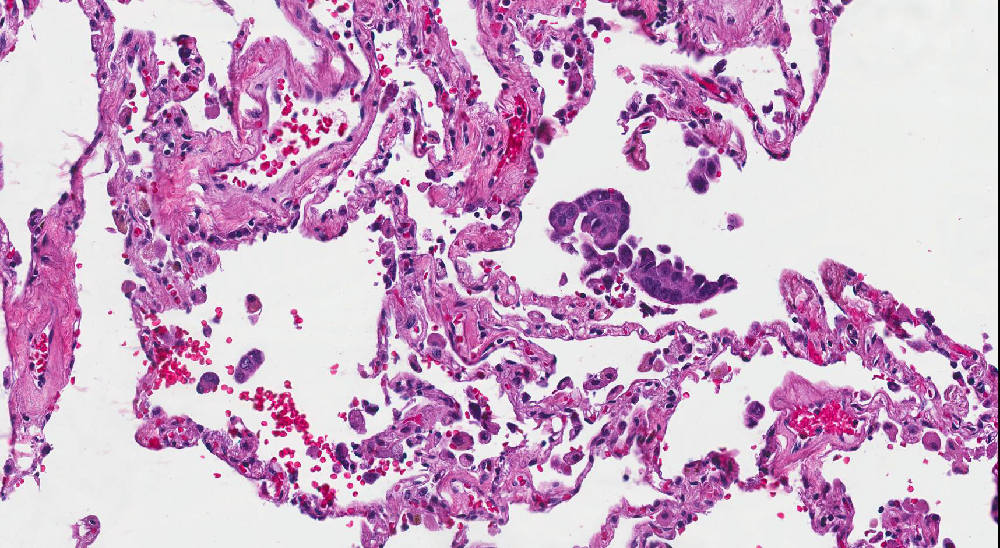

In [ ]:
from transformers import DetrFeatureExtractor, DetrForObjectDetection
from hugsvision.inference.ObjectDetectionInference import ObjectDetectionInference
import numpy as np
import os
from PIL import Image, ImageDraw

inference = ObjectDetectionInference(
    DetrFeatureExtractor.from_pretrained("/content/drive/MyDrive/models/STAS_DETRMODEL_RESNET-50/1000_2022-05-06-05-36-48"),
    DetrForObjectDetection.from_pretrained("/content/drive/MyDrive/models/STAS_DETRMODEL_RESNET-50/1000_2022-05-06-05-36-48", from_tf=False)
)

image, probas, bboxes = inference.predict(
    "/content/drive/MyDrive/datasets/肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽 I：運用物體偵測作法於找尋STAS/test/00000034.jpg",
    threshold = 0.05,
    visualize=True
)

# image = Image.open("/content/drive/MyDrive/datasets/BCCD_COCO/test/BloodImage_00227_jpg.rf.816711b066fae3bdf16851eaebc13eb5.jpg")

for p, (xmin, ymin, xmax, ymax) in zip(probas.tolist(), bboxes.tolist()):
    print(p, (xmin, ymin, xmax, ymax))
image

# Submit  Result of Public Test

## 建立 Public Test Datasets with Datasets

In [ ]:
import csv
import pandas as pd
import os

In [ ]:
root_PublicTestDatasets = '/content/drive/MyDrive/datasets/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS/Public_Image'
test_img_path = []
for path in tqdm(list(Path(root_PublicTestDatasets).rglob("*.jpg"))):
    test_img_path.append(str(path))
len(test_img_path),test_img_path[0]

100%|██████████| 131/131 [00:00<00:00, 296041.93it/s]


(131,
 '/content/drive/MyDrive/datasets/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS/Public_Image/Public_00000002.jpg')

In [ ]:
df = pd.DataFrame()
df['file'] = [str(i) for i in list(Path(root_PublicTestDatasets).rglob("*.jpg"))]
df['label'] = ["image":Image.open(image_file)]

In [ ]:
from datasets import load_dataset
# # dataset = load_dataset("/content/ai-cup-2022-crop_classification/datasets/crop14.py", 'crop14-small')
# dataset = load_dataset("/content/crop14.py", 'crop14-balance')
# dataset = load_dataset("gary109/crop14_balance", use_auth_token=True)
# dataset = load_dataset("gary109/crop14-small", use_auth_token=True)
# dataset = load_dataset("gary109/crop14-pretrain", use_auth_token=True, cache_dir='/content/drive/MyDrive/datasets/crop14-pretrain')
# dataset = load_dataset("gary109/crop14_balance", use_auth_token=True, cache_dir='/content/drive/MyDrive/datasets/cache_crop14-balance')
# dataset = load_dataset("STAS_colab.py","public-test", use_auth_token=True, cache_dir='/content/drive/MyDrive/datasets/cache_STAS')
dataset = load_dataset("gary109/STAS","public-test", use_auth_token=True, cache_dir='/content/drive/MyDrive/datasets/cache_STAS')
dataset

Downloading:   0%|          | 0.00/1.76k [00:00<?, ?B/s]

Using custom data configuration gary109--STAS-db397c9e3f2e43f9


Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Dataset parquet downloaded and prepared to /content/drive/MyDrive/datasets/cache_STAS/gary109___parquet/gary109--STAS-db397c9e3f2e43f9/0.0.0/0b6d5799bb726b24ad7fc7be720c170d8e497f575d02d47537de9a5bac074901. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

DatasetDict({
    test: Dataset({
        features: ['filename', 'image'],
        num_rows: 131
    })
})

In [ ]:
# dataset.push_to_hub("gary109/STAS")

Pushing split test to the Hub.


Pushing dataset shards to the dataset hub:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?ba/s]

## 預測 Public Test Dataset Results

In [ ]:
from transformers import DetrFeatureExtractor, DetrForObjectDetection
from hugsvision.inference.ObjectDetectionInference import ObjectDetectionInference
import numpy as np
import os
from PIL import Image, ImageDraw

inference = ObjectDetectionInference(
    DetrFeatureExtractor.from_pretrained("/content/drive/MyDrive/models/STAS_DETRMODEL_RESNET-50/1000_2022-05-06-05-36-48"),
    DetrForObjectDetection.from_pretrained("/content/drive/MyDrive/models/STAS_DETRMODEL_RESNET-50/1000_2022-05-06-05-36-48", from_tf=False)
)




Model loaded!


In [ ]:
submit_STAS_data = {}
for obj in tqdm(dataset['test']):
    imgName = f"{obj['filename']}" # obj['filename'].split('_')[-1]
    submit_STAS_data[imgName] = []
    image, probas, bboxes = inference.predict(obj['filename'], threshold = 0.05, visualize=False)
    for p, (xmin, ymin, xmax, ymax) in zip(probas.tolist(), bboxes.tolist()):
        xmin, ymin, xmax, ymax = int(xmin),int(ymin),int(xmax),int(ymax)
        score = float(f'{p[0]:10.5f}')
        submit_STAS_data[imgName].append([xmin,ymin,xmax,ymax,score])
    

100%|██████████| 131/131 [06:05<00:00,  2.79s/it]


In [ ]:
_submit_STAS_data = {}
for k,v in submit_STAS_data.items():
    _submit_STAS_data[f"Public_{k}"] = v

In [ ]:
import json 
out_root = '/content/drive/MyDrive/results/TBrain_AI_2022-肺腺癌病理切片影像之腫瘤氣道擴散偵測競賽/ObjecDetection_STAS'
Path(out_root).mkdir(parents=True, exist_ok=True)
submit_filename = f'submit_STAS_DETRMODEL_RESNET-50_1000_2022-05-06-05-36-48.json'
with open(os.path.join(out_root,submit_filename), "w") as f:
    json.dump(_submit_STAS_data, f)